#https://learn.microsoft.com/en-us/samples/azure-samples/serverless-chat-langchainjs/serverless-chat-langchainjs/

## Retrieval augmented generation
 
In retrieval augmented generation (RAG), an LLM retrieves contextual documents from an external dataset as part of its execution. 

This is useful if we want to ask question about specific documents (e.g., our PDFs, a set of videos, etc). 

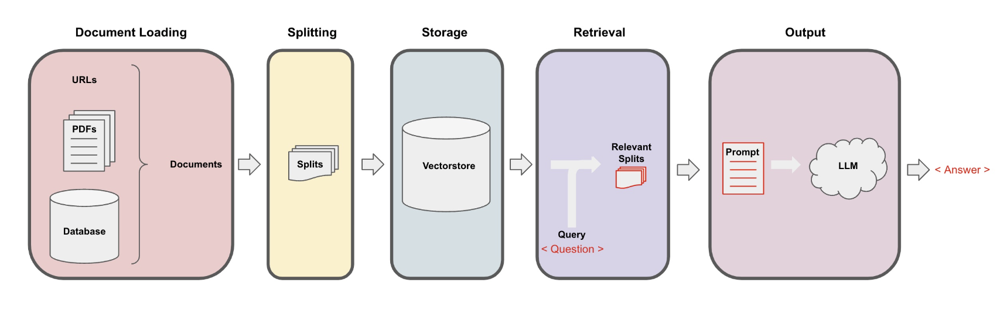

In [11]:
#! pip install langchain
#! pip install pypdf 

In [2]:
import os

In [4]:
from dotenv import load_dotenv
# Get configuration settings
load_dotenv()
# use an Azure OpenAI account
azure_endpoint = os.getenv("AZURE_OPENAI_ENDPOINT")
azure_openai_api_key = os.getenv("AZURE_OPENAI_API_KEY")
azure_openai_api_version = os.getenv("AZURE_OPENAI_API_VERSION")
azure_deployment = os.getenv("AZURE_OPENAI_EMBEDDING_DEPLOYMENT_NAME")
azure_chat_deployment = os.getenv("AZURE_OPENAI_CHAT_DEPLOYMENT_NAME")
azure_vector_store_address: str = os.getenv("AZURE_SEARCH_ENDPOINT")
azure_vector_store_password: str = os.getenv("AZURE_SEARCH_KEY")

In [5]:
azure_chat_deployment

'gpt-4'

In [14]:
# Import Azure OpenAI
from langchain_openai import AzureOpenAI

# Step 1: Document Loading

## Document Load: PDF

In [15]:
from langchain.document_loaders import PyPDFLoader
loader = PyPDFLoader("./data/MachineLearning-Lecture01.pdf")
pages = loader.load()

Each page is a `Document`.

A `Document` contains text (`page_content`) and `metadata`.

In [16]:
len(pages)

22

In [17]:
page = pages[0]

In [18]:
print(page.page_content[0:500])

MachineLearning-Lecture01  
Instructor (Andrew Ng):  Okay. Good morning. Welcome to CS229, the machine 
learning class. So what I wanna do today is ju st spend a little time going over the logistics 
of the class, and then we'll start to  talk a bit about machine learning.  
By way of introduction, my name's  Andrew Ng and I'll be instru ctor for this class. And so 
I personally work in machine learning, and I' ve worked on it for about 15 years now, and 
I actually think that machine learning i


In [19]:
page.metadata

{'source': './data/MachineLearning-Lecture01.pdf', 'page': 0}

## Document Load: YouTube

In [20]:
from langchain.document_loaders.generic import GenericLoader
from langchain.document_loaders.parsers import OpenAIWhisperParser
from langchain.document_loaders.blob_loaders.youtube_audio import YoutubeAudioLoader

In [21]:
# ! pip install yt_dlp
# ! pip install pydub
# ! pip install --upgrade --quiet  librosa
# ! pip install ffmpeg

In [22]:
from langchain_community.document_loaders.blob_loaders.youtube_audio import (
    YoutubeAudioLoader,
)
from langchain_community.document_loaders.generic import GenericLoader
from langchain_community.document_loaders.parsers import (
    OpenAIWhisperParser
)

In [23]:
local = False

In [24]:
urls = ["https://www.youtube.com/watch?v=jGwO_UgTS7I"]
save_dir="./data/youtube/"
loader = GenericLoader(
    YoutubeAudioLoader(urls,save_dir),
    OpenAIWhisperParser()
)
docs = loader.load()

[youtube] Extracting URL: https://www.youtube.com/watch?v=jGwO_UgTS7I
[youtube] jGwO_UgTS7I: Downloading webpage
[youtube] jGwO_UgTS7I: Downloading ios player API JSON
[youtube] jGwO_UgTS7I: Downloading mweb player API JSON
[youtube] jGwO_UgTS7I: Downloading player e627e516
[youtube] jGwO_UgTS7I: Downloading m3u8 information
[info] jGwO_UgTS7I: Downloading 1 format(s): 140
[download] Destination: data\youtube\Stanford CS229： Machine Learning Course, Lecture 1 - Andrew Ng (Autumn 2018).m4a
[download] 100% of   69.76MiB in 00:00:09 at 7.04MiB/s     


ERROR: Postprocessing: ffprobe and ffmpeg not found. Please install or provide the path using --ffmpeg-location


DownloadError: ERROR: Postprocessing: ffprobe and ffmpeg not found. Please install or provide the path using --ffmpeg-location

## URLs

In [25]:
import bs4
from langchain_community.document_loaders import WebBaseLoader

page_url = "https://basecamp.com/handbook/getting-started"

loader = WebBaseLoader(web_paths=[page_url])
docs = []
async for doc in loader.alazy_load():
    docs.append(doc)

assert len(docs) == 1
doc = docs[0]

USER_AGENT environment variable not set, consider setting it to identify your requests.


In [26]:
print(f"{doc.metadata}\n")
print(doc.page_content[:500].strip())

{'source': 'https://basecamp.com/handbook/getting-started', 'title': 'Getting Started', 'language': 'en'}

Getting Started



















Heads up! This page uses features your browser doesn‚Äôt support. Try a modern browser like Firefox or Chrome for the best experience.
    




37signals Employee Handbook

Chapter 1:
Getting Started


Next: Benefits & Perks





Getting started at 37signals involves a lot of little details, a number of big tasks, learning the details of your new job, meeting new coworkers, all while working remotely. Your teammates, your manager, your 37signals


# Step 2: Document Splitting

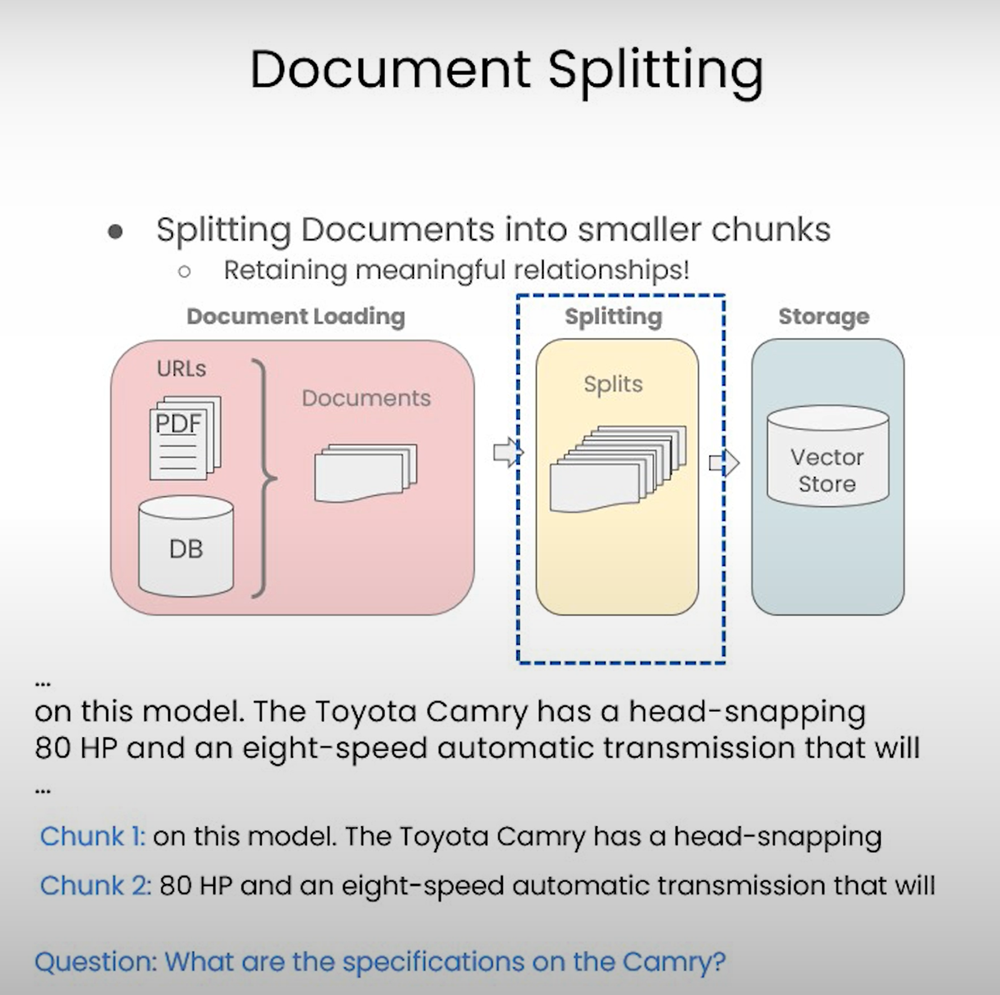

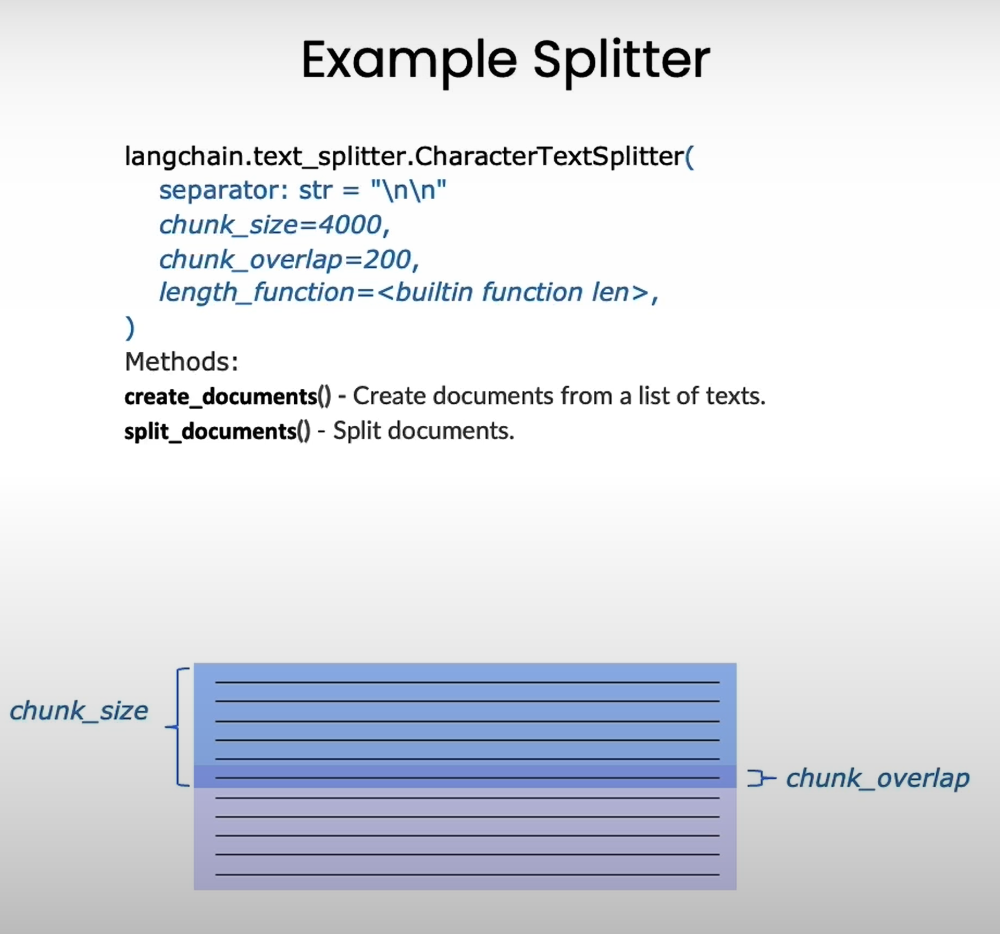

In [27]:
from langchain_text_splitters import RecursiveCharacterTextSplitter, CharacterTextSplitter, TokenTextSplitter, MarkdownHeaderTextSplitter

## Examples: Recurive, Character Text and Markdown Splitting

### Differences between Character and Recursive Text Splitting

In [39]:
chunk_size =26
chunk_overlap = 4

In [40]:
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=chunk_size,
    chunk_overlap=chunk_overlap
)
c_splitter = CharacterTextSplitter(
    chunk_size=chunk_size,
    chunk_overlap=chunk_overlap
)

In [41]:
text1 = 'abcdefghijklmnopqrstuvwxyz'

In [47]:
# doesn't split - becuase the chunk size is 26
print(r_splitter.split_text(text1))
print(c_splitter.split_text(text1))

['abcdefghijklmnopqrstuvwxyz']
['abcdefghijklmnopqrstuvwxyz']


In [48]:
text2 = 'abcdefghijklmnopqrstuvwxyzabcdefg'

In [49]:
# this one splits and check the overlap as well.
r_splitter.split_text(text2)

['abcdefghijklmnopqrstuvwxyz', 'wxyzabcdefg']

In [50]:
# character splitter splits on a new line chaacter by default 
c_splitter.split_text(text2)

['abcdefghijklmnopqrstuvwxyzabcdefg']

In [51]:
# text with spaces
text3 = "a b c d e f g h i j k l m n o p q r s t u v w x y z"

In [52]:
# spaces are considered and the overlap contains lm and the 2 spaces
r_splitter.split_text(text3)

['a b c d e f g h i j k l m', 'l m n o p q r s t u v w x', 'w x y z']

In [53]:
# character splitter splits on a new line chaacter by default 
c_splitter.split_text(text3)

['a b c d e f g h i j k l m n o p q r s t u v w x y z']

In [54]:
# we can set the separator as a space intead of default newline character in Character Splitter
c_splitter = CharacterTextSplitter(
    chunk_size=chunk_size,
    chunk_overlap=chunk_overlap,
    separator = ' '
)
# 
c_splitter.split_text(text3)

['a b c d e f g h i j k l m', 'l m n o p q r s t u v w x', 'w x y z']

###  Recursive splitting details

`RecursiveCharacterTextSplitter` is recommended for generic text.

In [55]:
some_text = """When writing documents, writers will use document structure to group content. \
This can convey to the reader, which idea's are related. For example, closely related ideas \
are in sentances. Similar ideas are in paragraphs. Paragraphs form a document. \n\n  \
Paragraphs are often delimited with a carriage return or two carriage returns. \
Carriage returns are the "backslash n" you see embedded in this string. \
Sentences have a period at the end, but also, have a space.\
and words are separated by space."""

In [56]:
len(some_text)

496

In [60]:
c_splitter = CharacterTextSplitter(
    chunk_size=150,
    chunk_overlap=0,
    separator = ' '
)
# Recursive character splits by "\n\n" first, next is "\n" and then " " and then no space.
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=150,
    chunk_overlap=0, 
    separators=["\n\n", "\n", " ", ""]
)

In [61]:
c_splitter.split_text(some_text)

["When writing documents, writers will use document structure to group content. This can convey to the reader, which idea's are related. For example,",
 'closely related ideas are in sentances. Similar ideas are in paragraphs. Paragraphs form a document. \n\n Paragraphs are often delimited with a carriage',
 'return or two carriage returns. Carriage returns are the "backslash n" you see embedded in this string. Sentences have a period at the end, but also,',
 'have a space.and words are separated by space.']

In [62]:
r_splitter.split_text(some_text)

["When writing documents, writers will use document structure to group content. This can convey to the reader, which idea's are related. For example,",
 'closely related ideas are in sentances. Similar ideas are in paragraphs. Paragraphs form a document.',
 'Paragraphs are often delimited with a carriage return or two carriage returns. Carriage returns are the "backslash n" you see embedded in this',
 'string. Sentences have a period at the end, but also, have a space.and words are separated by space.']

In [64]:
# lets add a period
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=150,
    chunk_overlap=0,
    separators=["\n\n", "\n", "\. ", " ", ""]
)
r_splitter.split_text(some_text)

<>:5: SyntaxWarning: invalid escape sequence '\.'
<>:5: SyntaxWarning: invalid escape sequence '\.'
C:\Users\vmunagal\AppData\Local\Temp\ipykernel_14072\1031251245.py:5: SyntaxWarning: invalid escape sequence '\.'
  separators=["\n\n", "\n", "\. ", " ", ""]


["When writing documents, writers will use document structure to group content. This can convey to the reader, which idea's are related. For example,",
 'closely related ideas are in sentances. Similar ideas are in paragraphs. Paragraphs form a document.',
 'Paragraphs are often delimited with a carriage return or two carriage returns. Carriage returns are the "backslash n" you see embedded in this',
 'string. Sentences have a period at the end, but also, have a space.and words are separated by space.']

In [65]:
# use regex
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=150,
    chunk_overlap=0,
    separators=["\n\n", "\n", "(?<=\. )", " ", ""]
)
r_splitter.split_text(some_text)

<>:5: SyntaxWarning: invalid escape sequence '\.'
<>:5: SyntaxWarning: invalid escape sequence '\.'
C:\Users\vmunagal\AppData\Local\Temp\ipykernel_14072\1342911804.py:5: SyntaxWarning: invalid escape sequence '\.'
  separators=["\n\n", "\n", "(?<=\. )", " ", ""]


["When writing documents, writers will use document structure to group content. This can convey to the reader, which idea's are related. For example,",
 'closely related ideas are in sentances. Similar ideas are in paragraphs. Paragraphs form a document.',
 'Paragraphs are often delimited with a carriage return or two carriage returns. Carriage returns are the "backslash n" you see embedded in this',
 'string. Sentences have a period at the end, but also, have a space.and words are separated by space.']

### Markdown Splitting

In [79]:
markdown_document = """# Subject\n\n \
## Chapter 1\n\n \
Hi this is Jim\n\n Hi this is Joe\n\n \
### Section \n\n \
Hi this is Lance \n\n 
## Chapter 2\n\n \
Hi this is Molly"""

In [80]:
headers_to_split_on = [
    ("#", "Header 1"),
    ("##", "Header 2"),
    ("###", "Header 3"),
]

In [96]:
markdown_splitter = MarkdownHeaderTextSplitter(
    headers_to_split_on=headers_to_split_on,
    return_each_line=False,
    strip_headers=False
)
md_header_splits = markdown_splitter.split_text(markdown_document)

In [98]:
md_header_splits[0]

Document(metadata={'Header 1': 'Subject', 'Header 2': 'Chapter 1'}, page_content='# Subject  \n## Chapter 1  \nHi this is Jim  \nHi this is Joe')

In [99]:
md_header_splits[1]

Document(metadata={'Header 1': 'Subject', 'Header 2': 'Chapter 1', 'Header 3': 'Section'}, page_content='### Section  \nHi this is Lance')

In [100]:
md_header_splits

[Document(metadata={'Header 1': 'Subject', 'Header 2': 'Chapter 1'}, page_content='# Subject  \n## Chapter 1  \nHi this is Jim  \nHi this is Joe'),
 Document(metadata={'Header 1': 'Subject', 'Header 2': 'Chapter 1', 'Header 3': 'Section'}, page_content='### Section  \nHi this is Lance'),
 Document(metadata={'Header 1': 'Subject', 'Header 2': 'Chapter 2'}, page_content='## Chapter 2  \nHi this is Molly')]

## Split the PDF File using Character Splitting

In [66]:
from langchain.document_loaders import PyPDFLoader
loader = PyPDFLoader("./data/MachineLearning-Lecture01.pdf")
pages = loader.load()

In [67]:
text_splitter = CharacterTextSplitter(
    separator="\n",
    chunk_size=1000,
    chunk_overlap=150,
    length_function=len
)

In [68]:
docs = text_splitter.split_documents(pages)

In [69]:
# Lets see how many chunks (or docs were created)
len(docs)

77

In [70]:
# Before the split
len(pages)

22

## Split the PDF file using Token Splitting
We can also split on token count explicity, if we want.

This can be useful because LLMs often have context windows designated in tokens.

Tokens are often ~4 characters.

In [28]:
text_splitter = TokenTextSplitter(chunk_size=1, chunk_overlap=0)

In [73]:
# Example
text1 = "foo bar bazzyfoo"
text_splitter.split_text(text1)

['foo bar bazzyfoo']

In [74]:
from langchain.document_loaders import PyPDFLoader
loader = PyPDFLoader("./data/MachineLearning-Lecture01.pdf")
pages = loader.load()

#let's split the PDF file in tokens
text_splitter = TokenTextSplitter(chunk_size=10, chunk_overlap=0)
docs = text_splitter.split_documents(pages)

In [75]:
docs[0]

Document(metadata={'source': './data/MachineLearning-Lecture01.pdf', 'page': 0}, page_content='MachineLearning-Lecture01  \n')

In [77]:
pages[0]

Document(metadata={'source': './data/MachineLearning-Lecture01.pdf', 'page': 0}, page_content='MachineLearning-Lecture01  \nInstructor (Andrew Ng):  Okay. Good morning. Welcome to CS229, the machine \nlearning class. So what I wanna do today is ju st spend a little time going over the logistics \nof the class, and then we\'ll start to  talk a bit about machine learning.  \nBy way of introduction, my name\'s  Andrew Ng and I\'ll be instru ctor for this class. And so \nI personally work in machine learning, and I\' ve worked on it for about 15 years now, and \nI actually think that machine learning is th e most exciting field of all the computer \nsciences. So I\'m actually always excited about  teaching this class. Sometimes I actually \nthink that machine learning is not only the most exciting thin g in computer science, but \nthe most exciting thing in all of human e ndeavor, so maybe a little bias there.  \nI also want to introduce the TAs, who are all graduate students doing researc

# Step 3: Vector Stores & Embeddings

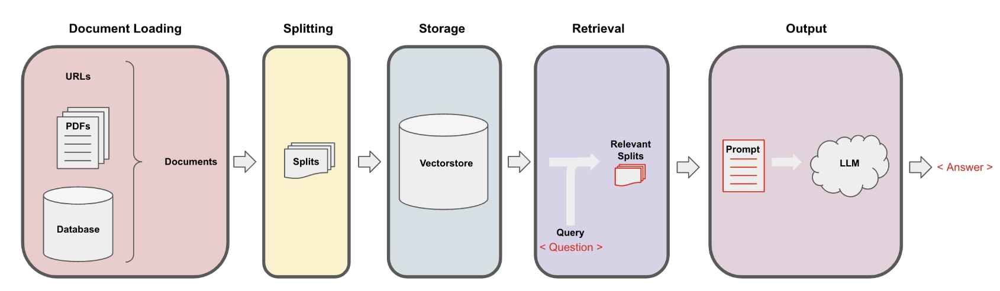

In [131]:
# doc source: https://see.stanford.edu/materials/aimlcs229/transcripts/MachineLearning-Lecture01.pdf
from langchain.document_loaders import PyPDFLoader
loaders = [
    # Duplicate documents on purpose - messy data
    PyPDFLoader("./data/MachineLearning-Lecture01.pdf"),
    PyPDFLoader("./data/MachineLearning-Lecture01.pdf"),
    PyPDFLoader("./data/MachineLearning-Lecture02.pdf"),
    PyPDFLoader("./data/MachineLearning-Lecture03.pdf")
]
docs = []
for loader in loaders:
    docs.extend(loader.load())

In [132]:
# Split
from langchain_text_splitters import RecursiveCharacterTextSplitter, CharacterTextSplitter, TokenTextSplitter, MarkdownHeaderTextSplitter
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size = 1500,
    chunk_overlap = 150
)

In [133]:
splits = text_splitter.split_documents(docs)

In [134]:
len(splits)

209

## Create Embeddings
Let's take our splits and embed them

In [33]:
from langchain_openai import AzureOpenAIEmbeddings, OpenAIEmbeddings

In [34]:
# Use AzureOpenAIEmbeddings with an Azure account
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

In [113]:
sentence1 = "i like dogs"
sentence2 = "i like canines"
sentence3 = "the weather is ugly outside"

In [114]:
embedding1 = embedding.embed_query(sentence1)
embedding2 = embedding.embed_query(sentence2)
embedding3 = embedding.embed_query(sentence3)

In [115]:
embedding1

[-0.020317386835813522,
 -0.01465585082769394,
 -0.0071745337918400764,
 -0.005396588239818811,
 0.0225206445902586,
 0.01213883701711893,
 -0.012961572967469692,
 -0.003118377411738038,
 -0.0017552856588736176,
 0.04043954983353615,
 -0.02203258126974106,
 -0.00925926212221384,
 -0.014878964982926846,
 -0.02551875077188015,
 -0.02242303267121315,
 -0.009935579262673855,
 0.002562333596870303,
 0.014837130904197693,
 0.0007316595292650163,
 -0.0014049257151782513,
 0.0278614554554224,
 -0.025156188756227493,
 -0.0017221670132130384,
 0.0332162082195282,
 0.022729815915226936,
 0.023970890790224075,
 -0.003806895576417446,
 -0.018755583092570305,
 -0.008255246095359325,
 -0.03519635275006294,
 -0.0068677510134875774,
 0.03148707002401352,
 -0.017793402075767517,
 0.03441544994711876,
 0.02150268480181694,
 -0.04414883255958557,
 0.03767850250005722,
 -0.014216593466699123,
 -0.003984690178185701,
 0.026466988027095795,
 0.022729815915226936,
 -0.007739292923361063,
 -0.01942492835223674

In [116]:
import numpy as np

In [117]:
# comparing similar embeddings.. the score will be closer to 1.
np.dot(embedding1, embedding2)

0.8321696918065915

In [119]:
# comparing dissimilar embeddings.. the score will be closer to 1.
np.dot(embedding1, embedding3)

0.15657575289433456

In [120]:
np.dot(embedding2, embedding3)

0.11708355581986625

### Vector Store

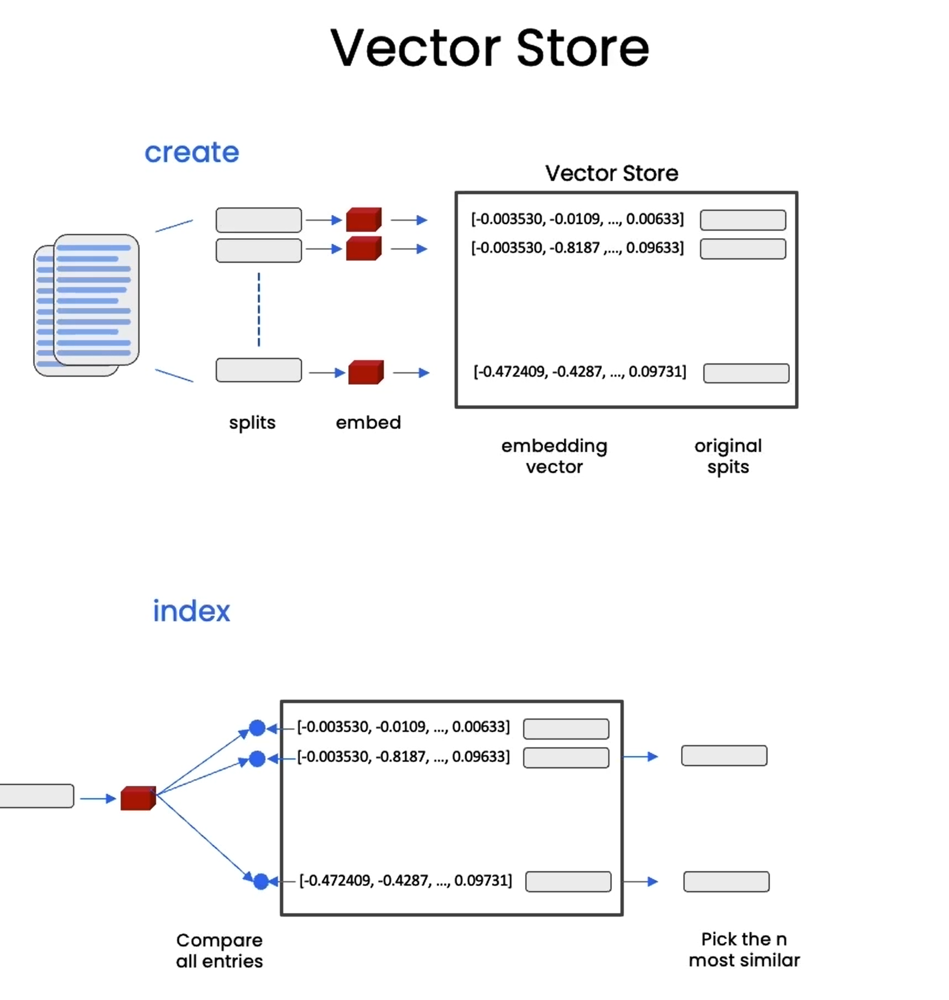

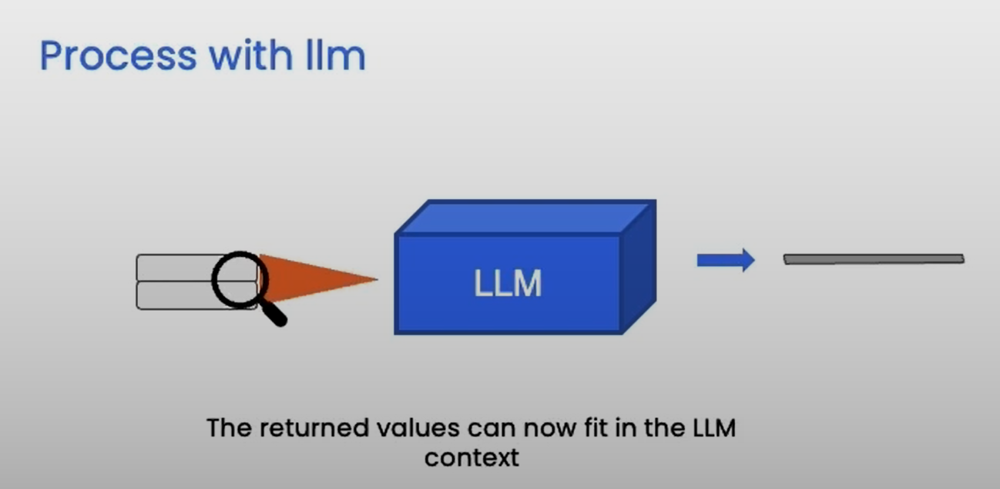

Vector store is a database. \
<b>Create:</b> \
You take the splits of the doc, create embeddings and store them in the vector store. \
<b>Index:</b> \
You take the question at hand, create an embedding and search through the vector and find similarity search. \
You take that embeddings and send it to LLM to generate response.

In [35]:
from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings, OpenAIEmbeddings

In [37]:
# Get Azure Open AI embedding instance (ada-002 model)
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

# Let's use Azure AI Search as Vector Store
index_name: str = "langchain-vector-index-01"
azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
)

In [40]:
splits

[Document(metadata={'source': './data/MachineLearning-Lecture01.pdf', 'page': 0}, page_content="MachineLearning-Lecture01  \nInstructor (Andrew Ng):  Okay. Good morning. Welcome to CS229, the machine \nlearning class. So what I wanna do today is ju st spend a little time going over the logistics \nof the class, and then we'll start to  talk a bit about machine learning.  \nBy way of introduction, my name's  Andrew Ng and I'll be instru ctor for this class. And so \nI personally work in machine learning, and I' ve worked on it for about 15 years now, and \nI actually think that machine learning is th e most exciting field of all the computer \nsciences. So I'm actually always excited about  teaching this class. Sometimes I actually \nthink that machine learning is not only the most exciting thin g in computer science, but \nthe most exciting thing in all of human e ndeavor, so maybe a little bias there.  \nI also want to introduce the TAs, who are all graduate students doing research in

In [39]:
azure_vector_db = azure_vector_store.add_documents(
    documents=splits
)

In [41]:
azure_vector_db

['N2M1MWE5OTAtNDQ1YS00NDY2LTkxZTgtZGRjMGYwODdhYjkx',
 'MWNiNjQxNTAtNzI5Mi00MDZmLWFiYjMtNzY3M2ViOTc1OWZj',
 'ODhmMjVlNTUtMGRkNS00ZDU2LTkyOTMtZDM3N2M1YmQ5ZThi',
 'M2YyNDFjYmEtMjBjMC00NTU1LTgyN2QtZTcyZmJmN2I5OTUx',
 'ZTdlNzdiM2YtNjRkNi00NGY3LWJjYjEtZDgwNThmYzBlZGZl',
 'ZDQ1YzhkNjItMTkzZC00NzUxLWFlZGEtMWJhMmNlNmFiMWIz',
 'NjI5ZDA1ZGEtNmZmNy00NWJhLWExZjEtZDgzMGIwOWFkMTZm',
 'NDdjZjYxMjgtMTczNS00M2Q5LWIyNDEtZmQ1ZTA4Zjg1ODAz',
 'ZTk3MTQ1NDMtZmE1Mi00NGNkLWFhNzUtNTRiYmQxOTNiZDNm',
 'ZDllZWY2MmItZjIzMi00NDg1LWI1YjAtYmQxOTBjMTk1ZWRk',
 'OWQzYWE4Y2MtOTBiOS00NjkzLTkxNDUtZGJiNDE5M2QxYTQ2',
 'YTI1ODJiZGMtYjM2Mi00Yjc2LTlkNjItMmZmOTNjMTBmOTNk',
 'ZDYzY2U3MmYtYWMyMy00MGE0LTg3N2EtOTM1ZGYwYzM4ODZm',
 'OTI5OGU5Y2QtNzZiNS00ODMxLTg1MDQtMTJmMTFkODQyMDA0',
 'NjE4YjI2NDQtYjIxYS00NTRhLWE2NDUtZmU2MDkxMzMzMmI0',
 'YWQ5YjUxZmQtOWFkYS00OTU1LThlNjMtODk2YTExYTk5NDZl',
 'NjEyMTUxNmYtM2VkZS00ZGI3LWE1ZGYtNDg3ODA5MDFjMjlh',
 'M2VlZmM1OWEtODJkYy00NjA3LTk4ODItYWQwM2VlMTExY2Yy',
 'MTEyY2ExZmQtMjEyNi00ODFlLWFlZGYtYjZmYmU5ZjAw

In [49]:
question = "is there an email i can ask for help"

In [50]:
# you may notice that we are getting duplicate results.
azure_vector_store.similarity_search(question,k=3)

[Document(metadata={'id': 'NjE4YjI2NDQtYjIxYS00NTRhLWE2NDUtZmU2MDkxMzMzMmI0', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 5}, page_content="cs229-qa@cs.stanford.edu. This goes to an acc ount that's read by all the TAs and me. So \nrather than sending us email individually, if you send email to this account, it will \nactually let us get back to you maximally quickly with answers to your questions.  \nIf you're asking questions about homework probl ems, please say in the subject line which \nassignment and which question the email refers to, since that will also help us to route \nyour question to the appropriate TA or to me  appropriately and get the response back to \nyou quickly.  \nLet's see. Skipping ahead — let's see — for homework, one midterm, one open and term \nproject. Notice on the honor code. So one thi ng that I think will help you to succeed and \ndo well in this class and even help you to enjoy this cla ss more is if you form a study \ngroup.  \nSo start lo

Navigate to Azure Portal --> Launch your Azure OpenAI Search \
Open your index - In this example, we are using `langchain-vector-index-01` \
You can give any examples, for example: "Who is the instructor for this course \
\
\
In this example, you will see the document is being retrieved twice. Remember we uploaded the duplicate documents intentionally to create messy data. \
 
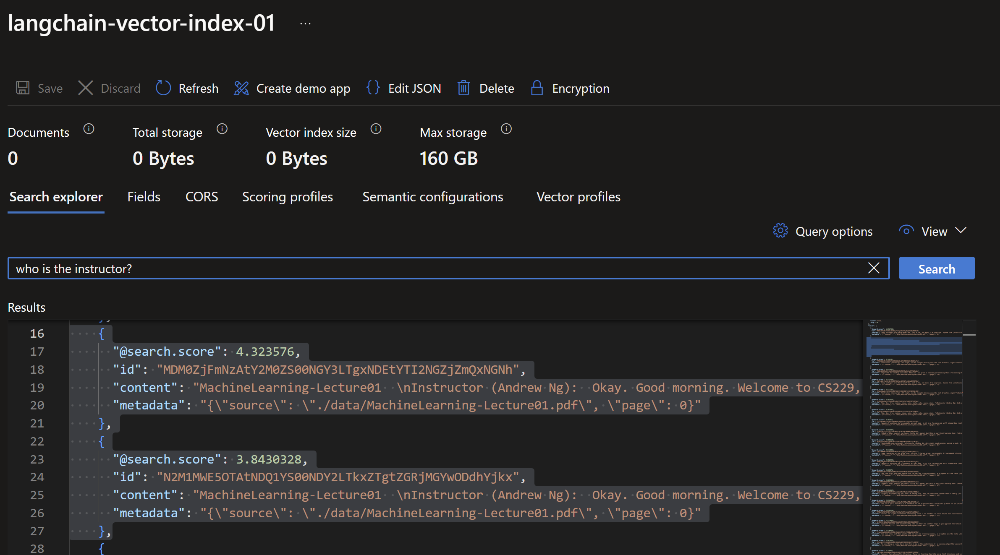

In [51]:
question = "what did they say about matlab?"
azure_vector_store.similarity_search(question,k=5)

[Document(metadata={'id': 'MGEzNTc1NDQtZDM5YS00N2E0LThhZjYtMmY1OGE3YzYwMWJh', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 8}, page_content='those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people call it a free ve rsion of MATLAB, which it sort  of is, sort of isn\'t.  \nSo I guess for those of you that haven\'t s een MATLAB before, and I know most of you \nhave, MATLAB is I guess part of the programming language that makes it very easy to write codes using matrices, to write code for numerical routines, to move data around, to \nplot data. And it\'s sort of an extremely easy to  learn tool to use for implementing a lot of \nlearning algorithms.  \nAnd in case some of you want to work on your  own home computer or something if you \ndon\'t have a MATLAB license, for the purposes of  this class, there\'s also — [inaudible] \nwrite that down [inaudible] MATLAB — there\' s also a software package called Octave \nthat you can downl

In [56]:
# we wanted notes from the second lecture (02), but here, the query is giving emphasis on "house prices" only
question = "what did they say about predicting house prices in the second lecture?"
azure_vector_store.similarity_search(question,k=5)

[Document(metadata={'id': 'OTljZGU3MzAtNWFhMy00ZGMyLWEyZWMtY2FiMTBkZjc1NTAw', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 11}, page_content="okay?  \nSo as an overview of what we're going to do in this class, this class is sort of organized \ninto four major sections. We're gonna talk about four major topics in this class, the first \nof which is supervised learning. So le t me give you an example of that.  \nSo suppose you collect a data set of housing prices. And one of the TAs, Dan Ramage, \nactually collected a data set for me last week to use in the example later. But suppose that \nyou go to collect statistics about how much hous es cost in a certain geographic area. And \nDan, the TA, collected data from housing pr ices in Portland, Oregon. So what you can do \nis let's say plot the square footage of the house against the list price of  the house, right, so \nyou collect data on a bunch of houses. And let' s say you get a data set like this with \nhouses of differe

In [ ]:
# !pip install chromadb

In [128]:
# We are using Chroma - an in-memory vector datastore. 
from langchain_community.vectorstores import Chroma

In [126]:
import sys
persist_directory = './data/chroma/'

In [125]:
!rm -rf persist_directory  # remove old database files if any

'rm' is not recognized as an internal or external command,
operable program or batch file.


In [129]:
vectordb = Chroma.from_documents(
    documents=splits,
    embedding=embedding,
    persist_directory=persist_directory
)

ImportError: Could not import chromadb python package. Please install it with `pip install chromadb`.

# Step 4: Retrieval

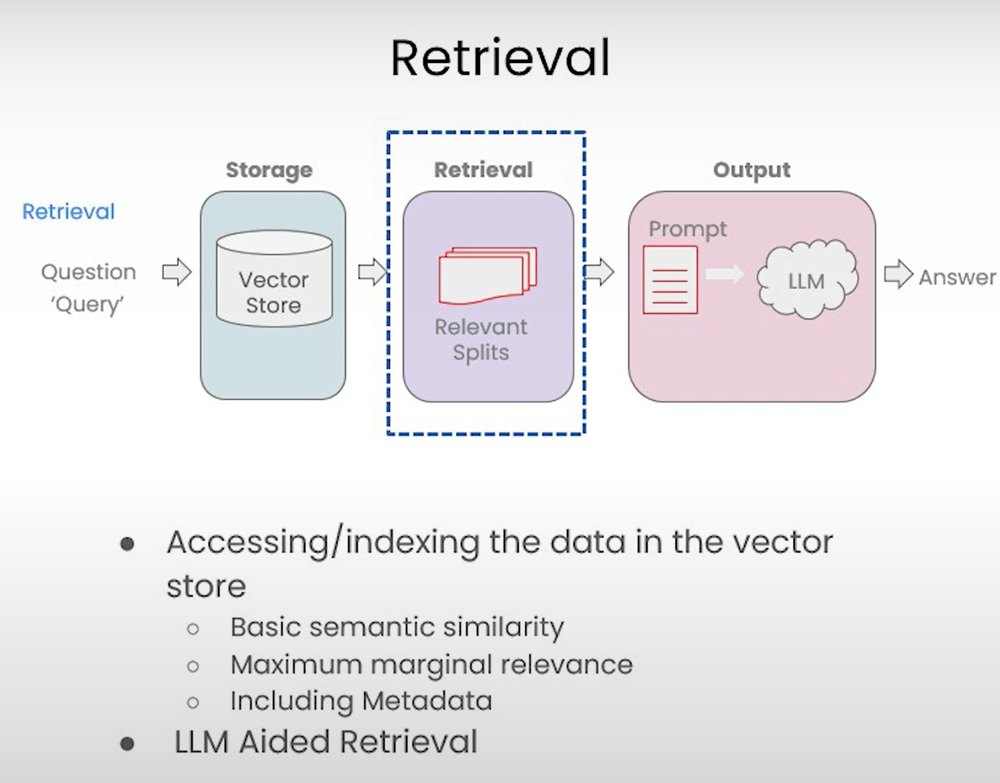

<h3> <b> MMR </b> </h3>
Maximal Marginal Relevance MMR is a method used to avoid redundancy while retrieving relevant items to a query. Instead of merely retrieving the most relevant items (which can often be very similar to each other), MMR ensures a balance between relevancy and diversity in the items retrieved.


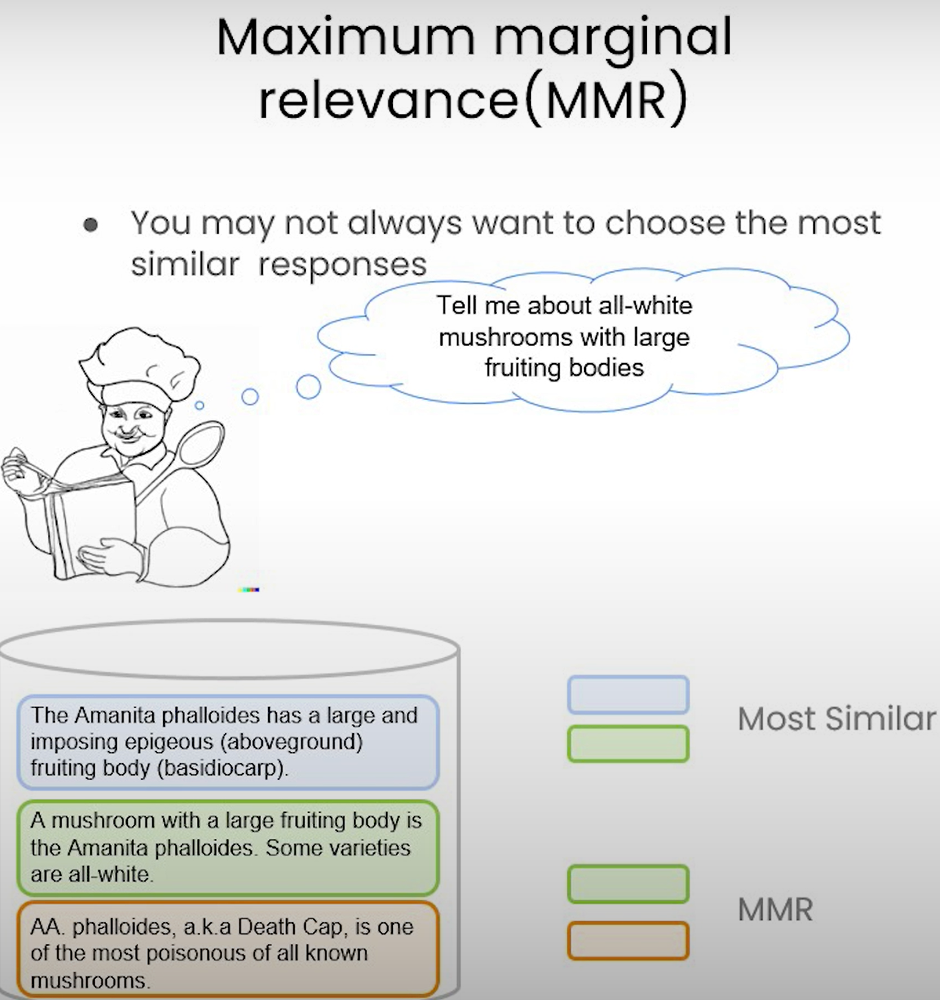


Maximal Marginal Relevance MMR is a method used to avoid redundancy while retrieving relevant items to a query. Instead of merely retrieving the most relevant items (which can often be very similar to each other), MMR ensures a balance between relevancy and diversity in the items retrieved. \
The idea behind MMR is that we send a query in, and then we initially get back a set of responses, with `fetch_k` being a parameter that we can control to determine how many responses we get. This is based solely on semantic similarity. We then work with that smaller set of documents and optimize for not only the most relevant ones, based on semantic similarity but also diverse ones. From that set of documents, we choose a final “k” to return to the user.


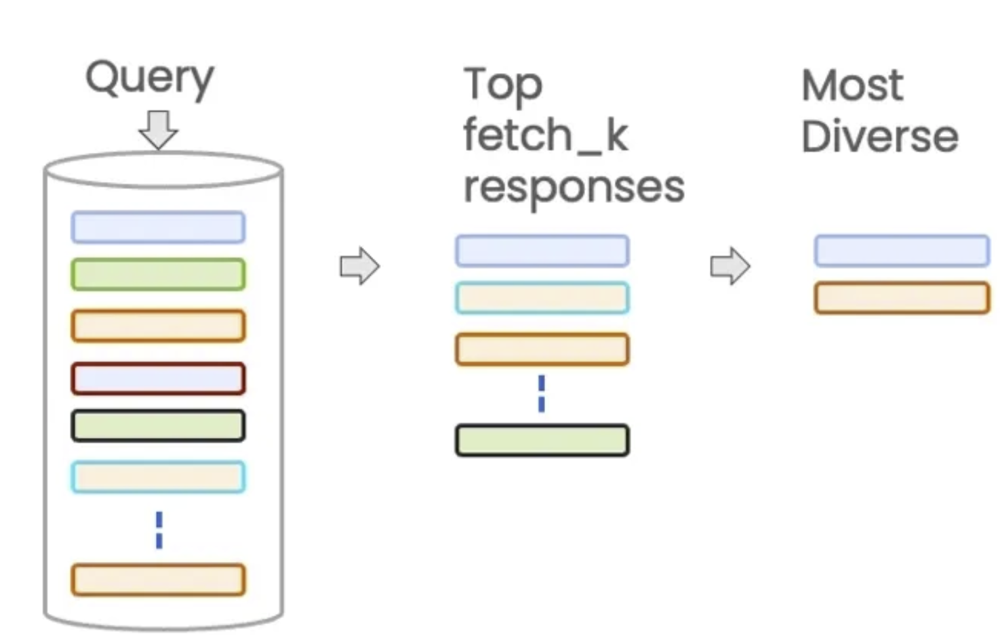

In [57]:
texts = [
    """The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).""",
    """A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.""",
    """A. phalloides, a.k.a Death Cap, is one of the most poisonous of all known mushrooms.""",
]

In [92]:
from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings
# Get Azure Open AI embedding instance (ada-002 model)
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)


In [93]:
# Let's use a new index in Azure AI Search as Vector Store for testing purpose
index_name: str = "langchain-vector-index-02"
azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
)

In [94]:
azure_vector_store.add_texts(texts=texts)

['YjFjMTU0MTMtZGY5Zi00NmU1LTkxOTMtZWEyNjYwMmU5Njhj',
 'OWQ1MmQ3NDMtNGFmMi00ODYyLWExMmMtM2M3MDBlYTYzNTg1',
 'ODdkZmQyMTEtNDg1Yi00MDNlLWEzYjUtNDQ1MjMyMzY0ZDg3']

In [95]:
question = "Tell me about all-white mushrooms with large fruiting bodies"

In [97]:
azure_vector_store.similarity_search(question, k=4)

[Document(metadata={'id': 'NjAwZGZjMzctM2I2ZC00NTc4LWIxYjMtOGQ4ODQzNWVmZDZh'}, page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(metadata={'id': 'OWQ1MmQ3NDMtNGFmMi00ODYyLWExMmMtM2M3MDBlYTYzNTg1'}, page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(metadata={'id': 'MTFiZTQ4OWYtZjgzMy00N2NlLWFjYWItMjk2YzAyYWJjNGZk'}, page_content='The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).'),
 Document(metadata={'id': 'YjFjMTU0MTMtZGY5Zi00NmU1LTkxOTMtZWEyNjYwMmU5Njhj'}, page_content='The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).')]

<h4>  max_marginal_relevance_search is <b> NOT IMPLEMENTED </b> in Azure Search AI Langchain 0.3.3 </h4>

In [99]:
#max_marginal_relevance_search is NOT IMPLEMENTED in Langchain 0.3.3
# azure_vector_store.max_marginal_relevance_search(query=question, k=2)

# altenatively
retriever = azure_vector_store.as_retriever(search_type="similarity", search_kwargs={"fetch_k":10, "lambda_mult":0.5})
docs = retriever.invoke(question)
docs

[Document(metadata={'id': 'NjAwZGZjMzctM2I2ZC00NTc4LWIxYjMtOGQ4ODQzNWVmZDZh'}, page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(metadata={'id': 'OWQ1MmQ3NDMtNGFmMi00ODYyLWExMmMtM2M3MDBlYTYzNTg1'}, page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(metadata={'id': 'MTFiZTQ4OWYtZjgzMy00N2NlLWFjYWItMjk2YzAyYWJjNGZk'}, page_content='The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).'),
 Document(metadata={'id': 'YjFjMTU0MTMtZGY5Zi00NmU1LTkxOTMtZWEyNjYwMmU5Njhj'}, page_content='The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).')]

In [ ]:
#https://api.python.langchain.com/en/latest/vectorstores/langchain_community.vectorstores.azuresearch.AzureSearch.html

<h3> <b> LLM Aided Retrieval </b> </h3>
There are other situations when the query to the database is more than an asked question. Another type of retrieval is the self-query. This is useful when you get questions that aren’t solely about the content that you want to look up semantically but also include some mention of some metadata that you want to filter on.

Let's take this question, what are some movies about aliens made in 1980? This question has two components to it. It’s got a semantic part, the alien's part. Therefore we want to look up aliens in our database of movies. But it’s also got a piece that refers to the metadata about each movie, which is the fact that the year should be 1980.

What we can do is we can use a language model itself to split that original question into two separate things, a filter and a search term. Most vector stores support a metadata filter. So you can easily filter records based on metadata like the year equal to 1980.

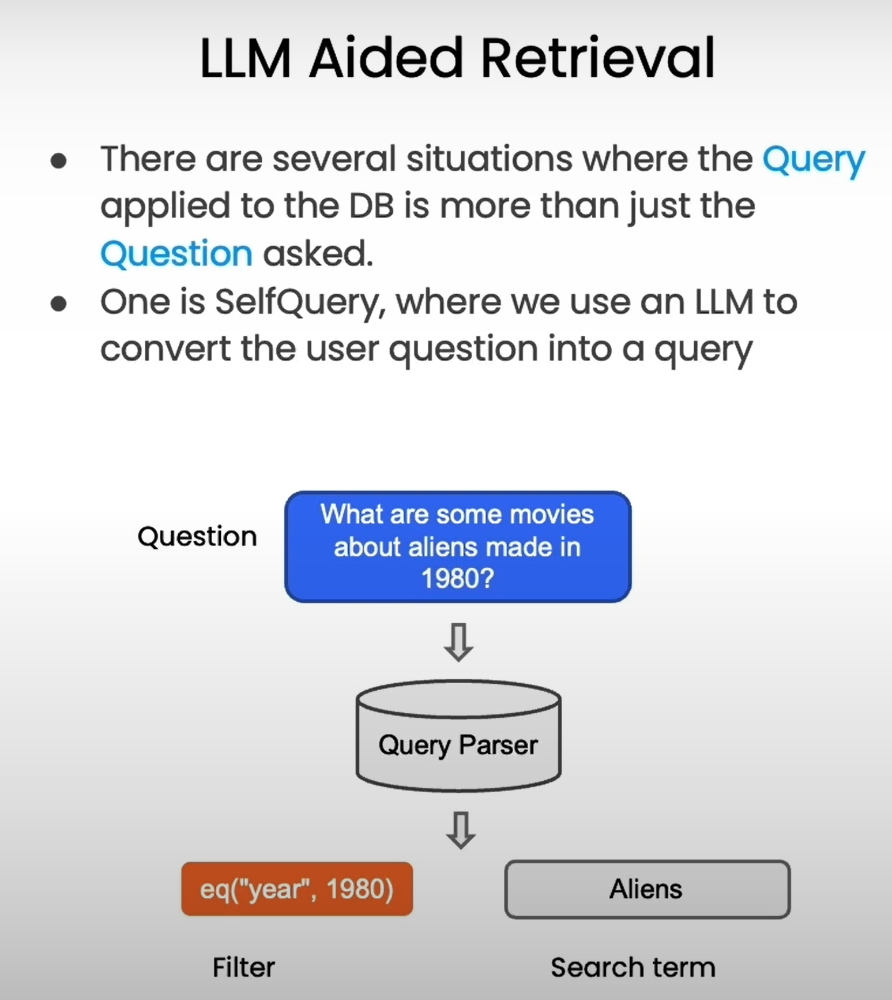

In [100]:

from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings
# Get Azure Open AI embedding instance (ada-002 model)
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)
# let's load the old vector index
index_name: str = "langchain-vector-index-01"
azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
)

In [101]:
# we wanted notes from the second lecture (02), but here, the query is giving emphasis on "house prices" only
question = "what did they say about predicting house prices in the second lecture?"
azure_vector_store.similarity_search(question,k=5)

[Document(metadata={'id': 'OTljZGU3MzAtNWFhMy00ZGMyLWEyZWMtY2FiMTBkZjc1NTAw', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 11}, page_content="okay?  \nSo as an overview of what we're going to do in this class, this class is sort of organized \ninto four major sections. We're gonna talk about four major topics in this class, the first \nof which is supervised learning. So le t me give you an example of that.  \nSo suppose you collect a data set of housing prices. And one of the TAs, Dan Ramage, \nactually collected a data set for me last week to use in the example later. But suppose that \nyou go to collect statistics about how much hous es cost in a certain geographic area. And \nDan, the TA, collected data from housing pr ices in Portland, Oregon. So what you can do \nis let's say plot the square footage of the house against the list price of  the house, right, so \nyou collect data on a bunch of houses. And let' s say you get a data set like this with \nhouses of differe

In [104]:
# NO affect - because metadata is sting value and cannot be filtered
source_filter = './data/MachineLearning-Lecture02.pdf'
azure_vector_store.similarity_search(
    question,
    k=5,
    search_type="similarity",
    kwargs = {'filters': f"source eq '{source_filter}'"}
)

[Document(metadata={'id': 'OTljZGU3MzAtNWFhMy00ZGMyLWEyZWMtY2FiMTBkZjc1NTAw', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 11}, page_content="okay?  \nSo as an overview of what we're going to do in this class, this class is sort of organized \ninto four major sections. We're gonna talk about four major topics in this class, the first \nof which is supervised learning. So le t me give you an example of that.  \nSo suppose you collect a data set of housing prices. And one of the TAs, Dan Ramage, \nactually collected a data set for me last week to use in the example later. But suppose that \nyou go to collect statistics about how much hous es cost in a certain geographic area. And \nDan, the TA, collected data from housing pr ices in Portland, Oregon. So what you can do \nis let's say plot the square footage of the house against the list price of  the house, right, so \nyou collect data on a bunch of houses. And let' s say you get a data set like this with \nhouses of differe

In [172]:
# NOT working either because metadata is sting value and cannot be filtered
## see https://github.com/langchain-ai/langchain/issues/9261
source_filter = './data/MachineLearning-Lecture02.pdf'
retriever = azure_vector_store.as_retriever(
    search_type='similarity',
    search_kwargs={
        'filter': {"source": {'$eq':source_filter}}
    },
)
docs = retriever.get_relevant_documents(question)
docs


[Document(metadata={'id': 'NWExYjFiMzQtYzM2Ni00NDM5LTg5N2YtNGYyYmYwNTBiNTkz', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 11}, page_content="okay?  \nSo as an overview of what we're going to do in this class, this class is sort of organized \ninto four major sections. We're gonna talk about four major topics in this class, the first \nof which is supervised learning. So le t me give you an example of that.  \nSo suppose you collect a data set of housing prices. And one of the TAs, Dan Ramage, \nactually collected a data set for me last week to use in the example later. But suppose that \nyou go to collect statistics about how much hous es cost in a certain geographic area. And \nDan, the TA, collected data from housing pr ices in Portland, Oregon. So what you can do \nis let's say plot the square footage of the house against the list price of  the house, right, so \nyou collect data on a bunch of houses. And let' s say you get a data set like this with \nhouses of differe

In [154]:
# making the source seachable
from azure.search.documents.indexes.models import (
    ScoringProfile,
    SearchableField,
    SearchField,
    SearchFieldDataType,
    SimpleField,
    TextWeights,
)

#  Replace OpenAIEmbeddings with AzureOpenAIEmbeddings if Azure OpenAI is your provider.
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

fields = [
    SimpleField(
        name="id",
        type=SearchFieldDataType.String,
        key=True,
        filterable=True,
    ),
    SearchableField(
        name="page_content",
        type=SearchFieldDataType.String,
        searchable=True,
    ),
    SearchableField(
        name="content",
        type=SearchFieldDataType.String,
        searchable=True,
    ),
    SearchField(
        name="content_vector",
        type=SearchFieldDataType.Collection(SearchFieldDataType.Single),
        searchable=True,
        vector_search_dimensions=len(embedding.embed_query("Text")),
        vector_search_profile_name="myHnswProfile",
    ),
    SearchableField(
        name="metadata",
        type=SearchFieldDataType.String,
        searchable=True,
    ),
    # Additional field to store the title
    SearchableField(
        name="title",
        type=SearchFieldDataType.String,
        searchable=True,
    ),
    # Additional field for filtering on document source
    SimpleField(
        name="source",
        type=SearchFieldDataType.String,
        filterable=True,
    ),
]

index_name: str = "langchain-vector-demo-03"

azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
    fields=fields,
)

In [136]:
splits

[Document(metadata={'source': './data/MachineLearning-Lecture01.pdf', 'page': 0}, page_content="MachineLearning-Lecture01  \nInstructor (Andrew Ng):  Okay. Good morning. Welcome to CS229, the machine \nlearning class. So what I wanna do today is ju st spend a little time going over the logistics \nof the class, and then we'll start to  talk a bit about machine learning.  \nBy way of introduction, my name's  Andrew Ng and I'll be instru ctor for this class. And so \nI personally work in machine learning, and I' ve worked on it for about 15 years now, and \nI actually think that machine learning is th e most exciting field of all the computer \nsciences. So I'm actually always excited about  teaching this class. Sometimes I actually \nthink that machine learning is not only the most exciting thin g in computer science, but \nthe most exciting thing in all of human e ndeavor, so maybe a little bias there.  \nI also want to introduce the TAs, who are all graduate students doing research in

In [155]:
#let's load the splits (machine learning)
azure_vector_db = azure_vector_store.add_documents(
    documents=splits
)

In [170]:
question = "what did they say about predicting house prices in the second lecture?"
#'what did they say about predicting house prices in the second lecture?'

In [161]:
source_filter = './data/MachineLearning-Lecture02.pdf'
azure_vector_store.similarity_search(
    query=question,
    k=5,
    search_type="similarity",
    filters=f"source eq '{source_filter}'"
)


[Document(metadata={'id': 'NTI5YzFlMjgtODcyZC00M2I3LTgzNzAtODU2YTFmY2U5NTEx', 'source': './data/MachineLearning-Lecture03.pdf', 'page': 7}, page_content='assume what we’re trying to prove. Instructor? \nThat’s the [inaudible] but, yes. You are assu ming that the error has zero mean. Which is, \nyeah, right. I think later this quarter we get to some of the other things, but for now just \nthink of this as a mathematically – it’s act ually not an unreasonabl e assumption. I guess, \nin machine learning all the assumptions we ma ke are almost never true in the absence \nsense, right? Because, for instance, housing pric es are priced to dollars and cents, so the \nerror will be – errors in prices are not c ontinued as value random variables, because \nhouses can only be priced at a certain number  of dollars and a certa in number of cents \nand you never have fractions of cents in housing prices. Whereas a Gaussian random'),
 Document(metadata={'id': 'M2FjY2E3YmYtZTQ5YS00ODA1LTg4YTctZjFjND

<h3> <b> Retrieval by Compression </b> </h3>

The last retrieval technique is compression. This can be useful to pull out only the most relevant bits of the retrieved passages. When you ask a question, you will get back the whole document that was stored, even if only the first one or two sentences are the relevant parts.

With compression, you can then run all those documents through a language model and then extract the most relevant segments. Then we pass only the most relevant segments into a final language model call.

This comes at the cost of making more calls to the language model, but it’s also really good for focusing the final answer on only the most important things. So it’s a bit of a tradeoff.

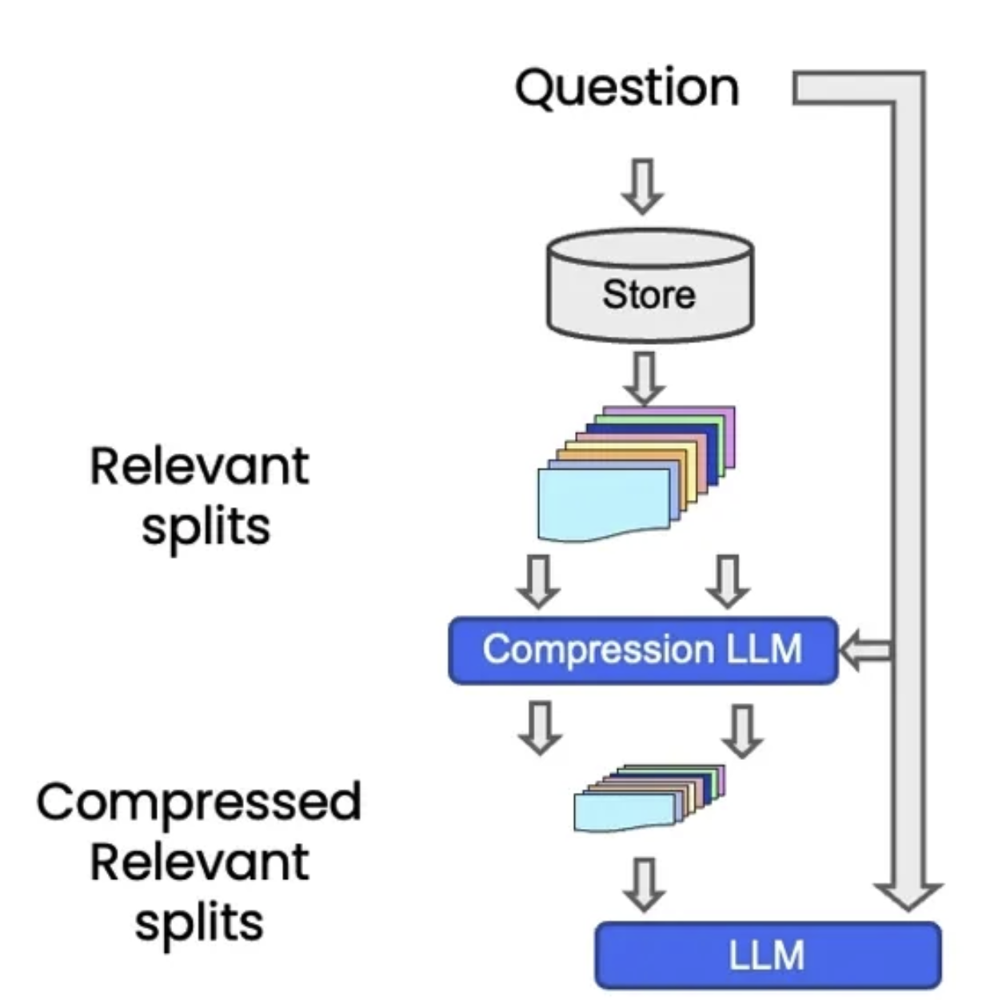

Another approach for improving the quality of retrieved docs is compression.

Information most relevant to a query may be buried in a document with a lot of irrelevant text. 

Passing that full document through your application can lead to more expensive LLM calls and poorer responses.

Contextual compression is meant to fix this. 

In [162]:
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import LLMChainExtractor
from langchain_openai import AzureOpenAI

In [163]:
def pretty_print_docs(docs):
    print(f"\n{'-' * 100}\n".join([f"Document {i+1}:\n\n" + d.page_content for i, d in enumerate(docs)]))


In [184]:
azure_chat_deployment

'gpt-35-turbo-16k'

In [190]:

# need to use "Completions" deployment model. Ex: gpt-35-turbo
llm = AzureOpenAI(
    api_key=azure_openai_api_key,
    api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    azure_deployment="gpt-35-turbo"
)
#extract only the relevant bits from all the docs and pass those as the final response 
compressor = LLMChainExtractor.from_llm(llm)

In [191]:
compression_retriever = ContextualCompressionRetriever(
    base_compressor=compressor,
    base_retriever=azure_vector_store.as_retriever()
)

In [192]:
compression_retriever

ContextualCompressionRetriever(base_compressor=LLMChainExtractor(llm_chain=PromptTemplate(input_variables=['context', 'question'], input_types={}, output_parser=NoOutputParser(), partial_variables={}, template='Given the following question and context, extract any part of the context *AS IS* that is relevant to answer the question. If none of the context is relevant return NO_OUTPUT. \n\nRemember, *DO NOT* edit the extracted parts of the context.\n\n> Question: {question}\n> Context:\n>>>\n{context}\n>>>\nExtracted relevant parts:')
| AzureOpenAI(client=<openai.resources.completions.Completions object at 0x0000026A37A72F00>, async_client=<openai.resources.completions.AsyncCompletions object at 0x0000026A2F6D1880>, model_kwargs={}, openai_api_key=SecretStr('**********'), logit_bias={}, azure_endpoint='https://demooai01.openai.azure.com/', deployment_name='gpt-35-turbo', openai_api_version='2024-09-01-preview', openai_api_type='azure')
| NoOutputParser(), get_input=<function default_get_

In [193]:
question = "what did they say about matlab?"
compressed_docs = compression_retriever.get_relevant_documents(question)
pretty_print_docs(compressed_docs)

Document 1:

- those homeworks will be done in either MATLA B or in Octave
- know some people call it a free ve rsion of MATLAB, which it sort  of is, sort of isn't. 
- I guess part of the programming language that makes it very easy to write codes using matrices, to write code for numerical routines, to move data around, to plot data. And it's sort of an extremely easy to  learn tool to use for implementing a lot of learning algorithms.  
- MATLAB — there' s also a software package called Octave that you can download for free off the Internet. And it has somewhat fewer features than MATLAB, but it's free, and for the purposes of  this class, it will work for just about everything.  
- So actually I, well, so yeah, just a side comment for those of you that haven't seen MATLAB before I guess, once a colleague of mine at a different university, not at Stanford, actually teaches another machine l earning course.

Correct output (string): 
- those homeworks will be done in either MATLA B o

# Step 5: Question Answering
Now, let's take the docs that are retrieved by the vector search and take the original question, pass the both to the language model and ask it to answer the question for us. 

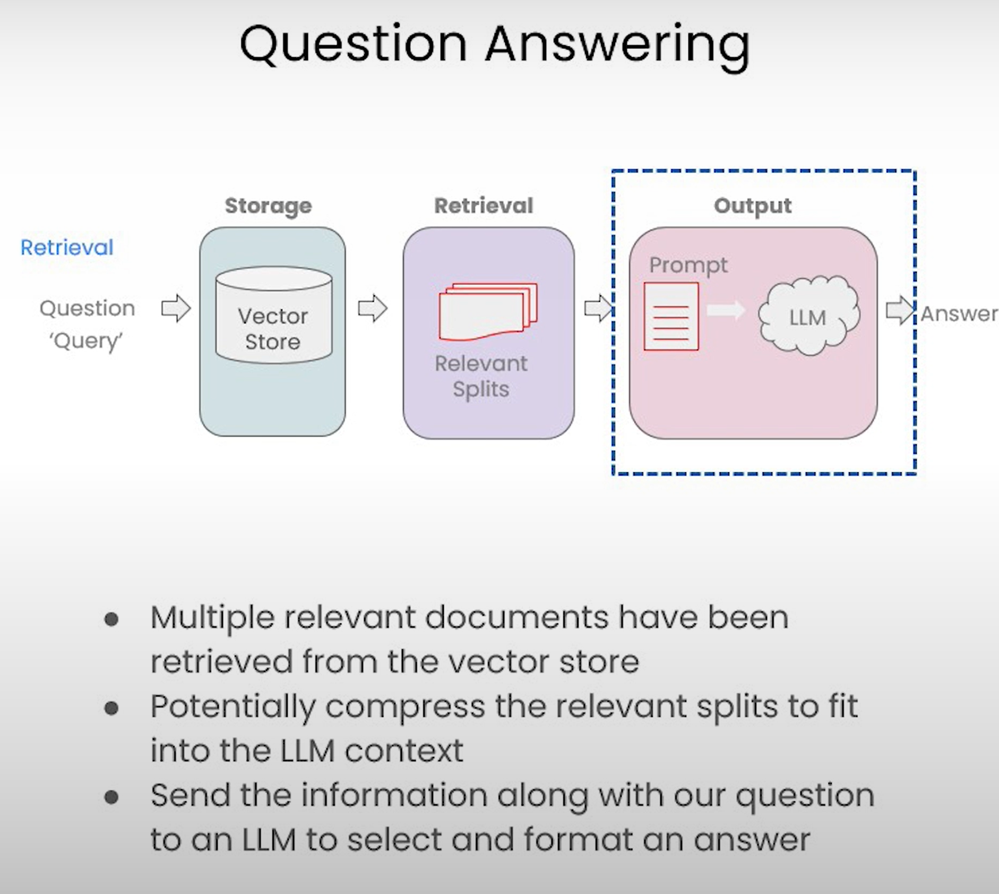

We will first see how to do question answering after multiple relevant splits have been retrieved from the vector store. We may also need to compress the relevant splits to fit into the LLM context. Finally, we send these splits along with a system prompt and human question to the language model to get the answer.

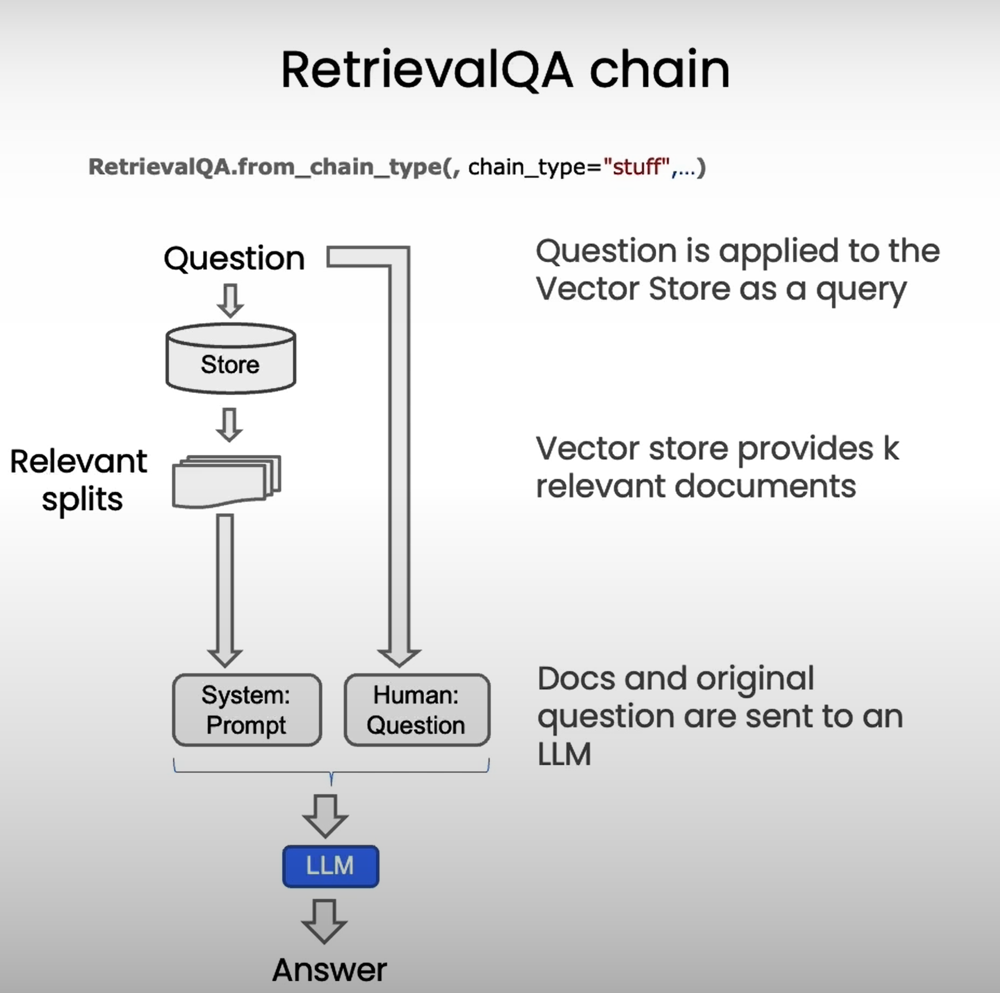

If there are lots of documents, you simply cannot pass them all in the same context window. The below are the 3 methods to get around the short context windows.

1. Stuff: Combines all documents into one prompt.
2. Map-reduce: Processes document chunks independently, then summarizes.
* Map Step: We will go through each document one by one and derive topic classification on each post individually. The LLM will be used to create these classifications, which are unique to each Post.
* Reduce Step: After all documents have topics generated, we use the LLM to coalesce them into a single set of topics that are unique and conceptually different.

3. Refine: Builds upon previous answers iteratively.

4. Map-rerank: Scores each document, selects the highest score.

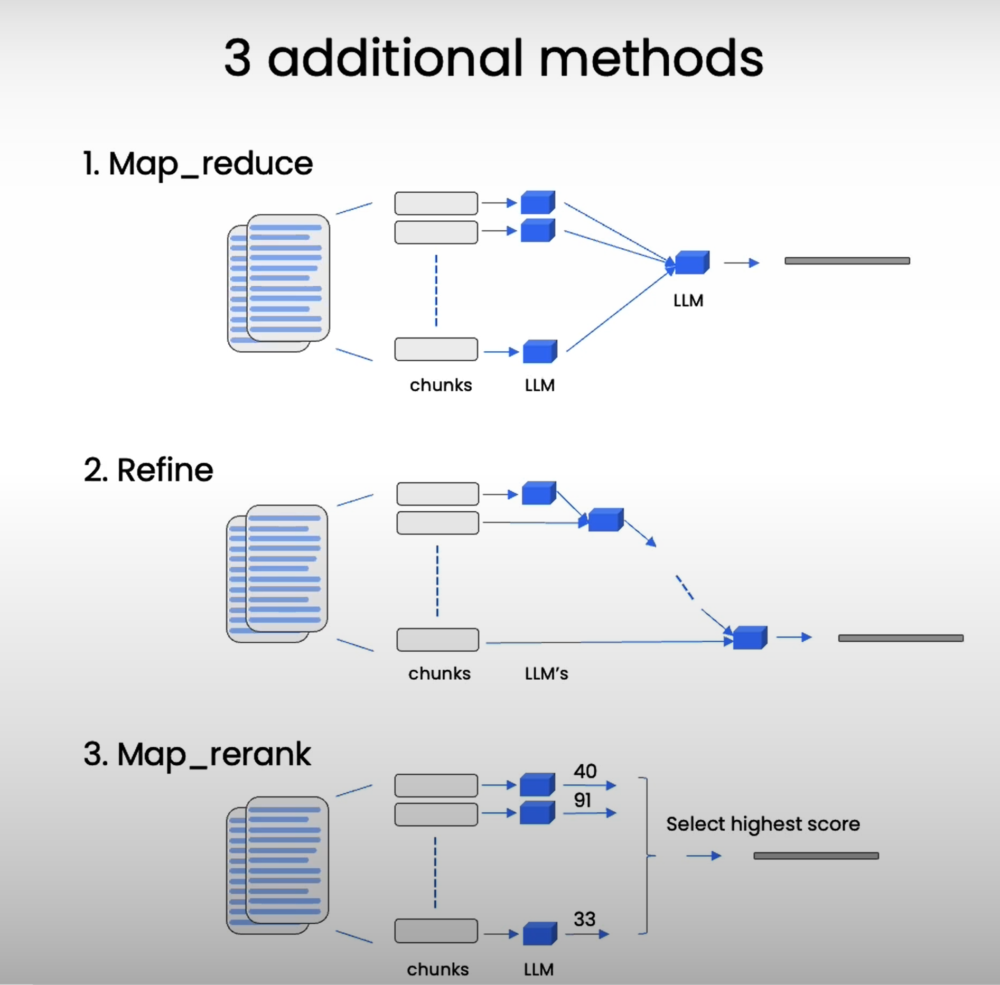

In [6]:
from langchain_openai import AzureOpenAI
from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings

llm = AzureOpenAI(
    api_key=azure_openai_api_key,
    api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    azure_deployment="gpt-4"
)

# Get Azure Open AI embedding instance (ada-002 model)
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

# let's load the vector index that contains the ML lectures
index_name: str = "langchain-vector-demo-03"
azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
)

In [20]:
# search from the vector store
question = "What are major topics for this class?"
docs = azure_vector_store.similarity_search(question,k=5)
len(docs)
docs

[Document(metadata={'id': 'ZmY3NjkxYWMtMzlhNy00ZmZkLTkwMTgtYjdmYjRhYmQ0NjZl', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 8}, page_content='into his office and he said, "Oh, professo r, professor, thank you so much for your \nmachine learning class. I learned so much from it. There\'s this stuff that I learned in your \nclass, and I now use every day. And it\'s help ed me make lots of money, and here\'s a \npicture of my big house."  \nSo my friend was very excited. He said, "W ow. That\'s great. I\'m glad to hear this \nmachine learning stuff was actually useful. So what was it that you learned? Was it \nlogistic regression? Was it the PCA? Was it the data ne tworks? What was it that you \nlearned that was so helpful?" And the student said, "Oh, it was the MATLAB."  \nSo for those of you that don\'t know MATLAB yet, I hope you do learn it. It\'s not hard, \nand we\'ll actually have a short MATLAB tutori al in one of the discussion sections for \nthose of you that don\'t 

In [9]:
from langchain_openai import AzureChatOpenAI

#setting temperature=0; to get factual answers. low variability and high fidelity. 
llm = AzureChatOpenAI(    
    api_key=azure_openai_api_key,
    api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    azure_deployment="gpt-4",
    temperature=0
    )


In [15]:
system_prompt = (
    "Use the following pieces of context to answer the question at the end. "
    "If you don't know the answer, just say that you don't know, don't try to make up an answer."
    "Use three sentences maximum. Keep the answer as concise as possible."
    """Always say "thanks for asking!" at the end of the answer."""
)
print(system_prompt)

Use the following pieces of context to answer the question at the end. If you don't know the answer, just say that you don't know, don't try to make up an answer.Use three sentences maximum. Keep the answer as concise as possible.Always say "thanks for asking!" at the end of the answer.


In [16]:
docs

[Document(metadata={'id': 'ZmY3NjkxYWMtMzlhNy00ZmZkLTkwMTgtYjdmYjRhYmQ0NjZl', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 8}, page_content='into his office and he said, "Oh, professo r, professor, thank you so much for your \nmachine learning class. I learned so much from it. There\'s this stuff that I learned in your \nclass, and I now use every day. And it\'s help ed me make lots of money, and here\'s a \npicture of my big house."  \nSo my friend was very excited. He said, "W ow. That\'s great. I\'m glad to hear this \nmachine learning stuff was actually useful. So what was it that you learned? Was it \nlogistic regression? Was it the PCA? Was it the data ne tworks? What was it that you \nlearned that was so helpful?" And the student said, "Oh, it was the MATLAB."  \nSo for those of you that don\'t know MATLAB yet, I hope you do learn it. It\'s not hard, \nand we\'ll actually have a short MATLAB tutori al in one of the discussion sections for \nthose of you that don\'t 

## Q & A: Sending the vector store docs directly in the Chat Prompt

In [21]:
from langchain_core.prompts import ChatPromptTemplate
prompt = ChatPromptTemplate.from_messages(
    [
        (
            "system",
            "{system_input}"
            "\n\n"
            "{context}"
        ),
        ("human", "{human_input}"),
    ]
)

chain = prompt | llm
response = chain.invoke(
    {
        "system_input": system_prompt,
        "context": docs,
        "human_input": question
    }
)
response.content

'The major topics for this class include logistic regression, PCA (Principal Component Analysis), and data networks. Thanks for asking!'

## Q & A: Stuff method
The stuff document chain takes all the loaded documents and combines them into a single prompt specifically designed for the LLM model.

### Directly passing context

In [22]:
from langchain.chains.combine_documents import create_stuff_documents_chain
from langchain_core.prompts import ChatPromptTemplate

prompt = ChatPromptTemplate.from_messages(
    [
        (
            "system",
            "{system_input}"
            "\n\n"
            "{context}"
        ),
        ("human", "{human_input}"),
    ]
)
chain = create_stuff_documents_chain(llm, prompt)

In [24]:
response = chain.invoke(
    {
        "system_input": system_prompt,
        "context": docs,
        "human_input": question
    }
)
response

'The major topics for this class include machine learning algorithms, applications of machine learning such as reading zip codes, and extensions of machine learning material not covered in the main lectures. Thanks for asking!'

### Combining Retriever and Chain: Retrieval Chain
Here the retreiver will generate the context based on the question that is asked by the user.
Personally, this gave me better results 

In [28]:
from langchain.chains.combine_documents import create_stuff_documents_chain
from langchain_core.prompts import ChatPromptTemplate

prompt = ChatPromptTemplate.from_template("""
    Use the following pieces of context to answer the question at the end.
    If you don't know the answer, just say that you don't know, don't try to make up an answer.
    Use three sentences maximum. Keep the answer as concise as possible.
    Always say "thanks for asking!" at the end of the answer.
    {context}
    </context>
    Question: {input}""")
chain = create_stuff_documents_chain(llm, prompt)

In [29]:
from langchain.chains import create_retrieval_chain
# Create retriever from vector store
retriever=azure_vector_store.as_retriever()
# Create retrieval chain by combining retriever and document chain
retrieval_chain = create_retrieval_chain(retriever, chain)

In [30]:
response = retrieval_chain.invoke(
    {
        "input": question
    }
)
response

{'input': 'What are major topics for this class?',
 'context': [Document(metadata={'id': 'ZmY3NjkxYWMtMzlhNy00ZmZkLTkwMTgtYjdmYjRhYmQ0NjZl', 'source': './data/MachineLearning-Lecture01.pdf', 'page': 8}, page_content='into his office and he said, "Oh, professo r, professor, thank you so much for your \nmachine learning class. I learned so much from it. There\'s this stuff that I learned in your \nclass, and I now use every day. And it\'s help ed me make lots of money, and here\'s a \npicture of my big house."  \nSo my friend was very excited. He said, "W ow. That\'s great. I\'m glad to hear this \nmachine learning stuff was actually useful. So what was it that you learned? Was it \nlogistic regression? Was it the PCA? Was it the data ne tworks? What was it that you \nlearned that was so helpful?" And the student said, "Oh, it was the MATLAB."  \nSo for those of you that don\'t know MATLAB yet, I hope you do learn it. It\'s not hard, \nand we\'ll actually have a short MATLAB tutori al in

## Map-Reduce (TODO)

The Map-Reduce method involves summarizing each document individually (map step) and then combining these summaries into a final summary (reduce step). This approach is more scalable and can handle larger volumes of text.The map_reduce technique is designed for summarizing large documents that exceed the token limit of the language model. It involves dividing the document into chunks, generating summaries for each chunk, and then combining these summaries to create a final summary. This method is efficient for handling large files and significantly reduces processing time.

Pros:
* Effectively handles large documents by dividing them into manageable chunks.
* Reduces processing time by processing chunks individually.

Cons:
* Requires extra steps in combining individual summaries, which can add complexity to the process.

# Step 6: Prepare a Chatbot

Storing the history

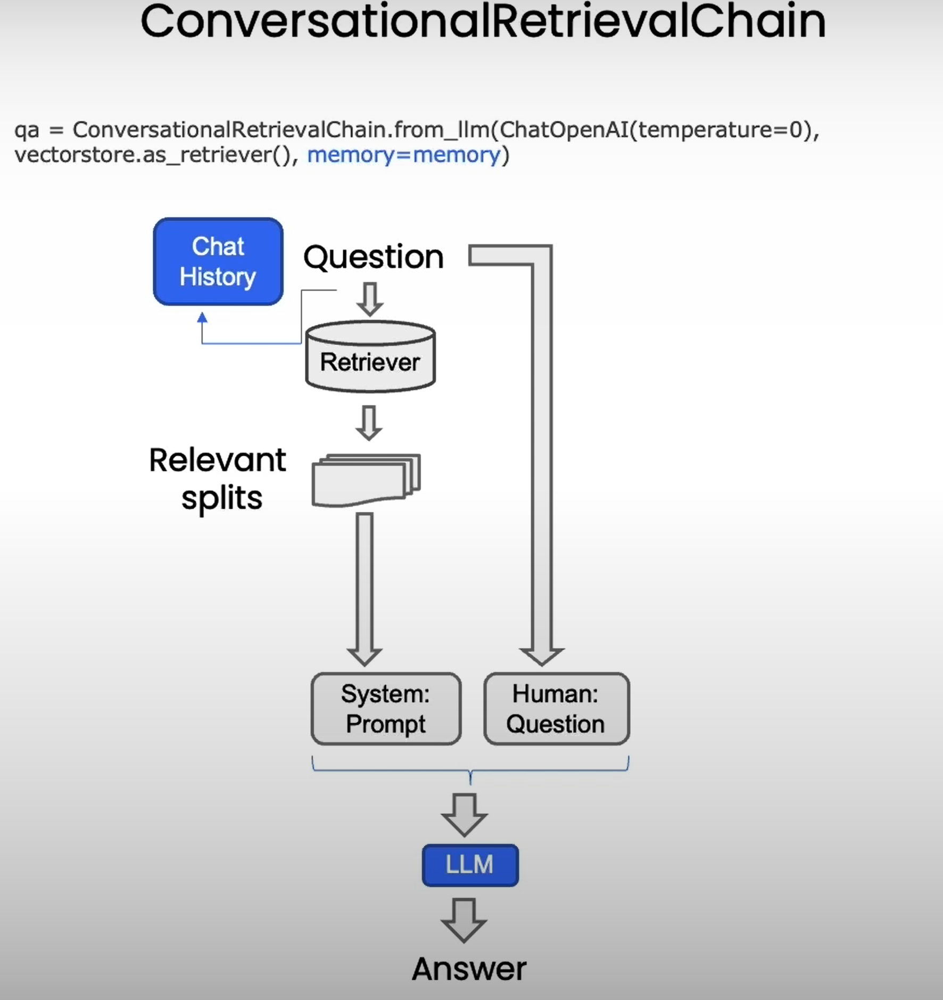

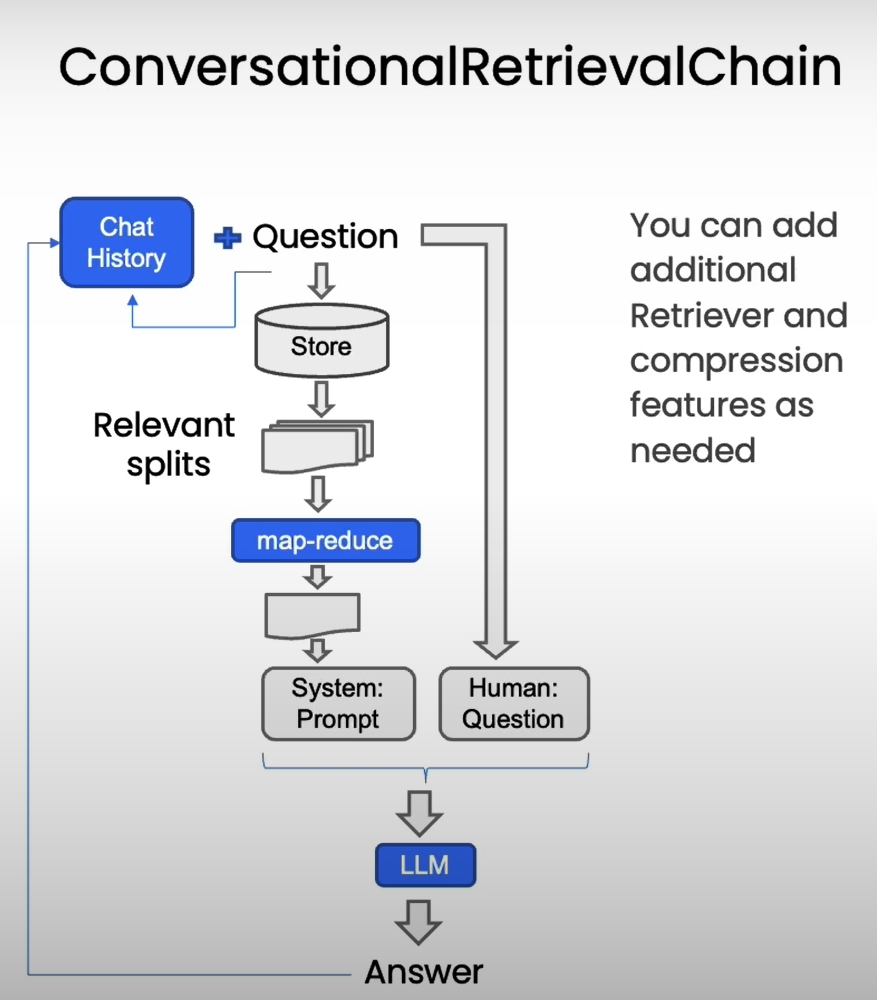

In [ ]:
# !pip install --upgrade --quiet langchain langchain-openai langgraph

https://github.com/langchain-ai/langgraph/blob/main/docs/docs/tutorials/chatbots/information-gather-prompting.ipynb

In [ ]:
# Building agents as graphs - way to create cyclical agent runtime

In [51]:
from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings

from langchain_openai import AzureChatOpenAI

#setting temperature=0; to get factual answers. low variability and high fidelity. 
llm = AzureChatOpenAI(    
    api_key=azure_openai_api_key,
    api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    azure_deployment="gpt-4",
    temperature=0
    )

# Get Azure Open AI embedding instance (ada-002 model)
embedding: AzureOpenAIEmbeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

# let's load the vector index that contains the ML lectures
index_name: str = "langchain-vector-demo-03"
azure_vector_store: AzureSearch = AzureSearch(
    azure_search_endpoint=azure_vector_store_address,
    azure_search_key=azure_vector_store_password,
    index_name=index_name,
    embedding_function=embedding.embed_query,
)
# get the retriever
retriever = azure_vector_store.as_retriever()

### Define the tools

In [38]:
# Then we create a retriever tool.
from langchain.tools.retriever import create_retriever_tool

retriever_tool = create_retriever_tool(
    retriever,
    name="retrieve_lecture_notes",
    description="Search and return lecture notes about Machine Learning by Andrew Ng",
)

tools = [retriever_tool]

### Bind the Tools to the Model

In [52]:
llm_with_tools = llm.bind_tools(tools)

In [53]:
query = "Who are you? Tell me about yourself?"
llm_with_tools.invoke(query)

AIMessage(content="I'm an AI language model created by OpenAI, designed to assist and provide information across a wide range of topics. I can help answer questions, provide explanations, generate text, and much more. Whether you need help with a specific task, looking for detailed explanations, or just curious about something, feel free to ask and I'll do my best to assist you!", additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 75, 'prompt_tokens': 71, 'total_tokens': 146, 'completion_tokens_details': None, 'prompt_tokens_details': None}, 'model_name': 'gpt-4-turbo-2024-04-09', 'system_fingerprint': 'fp_5b26d85e12', 'prompt_filter_results': [{'prompt_index': 0, 'content_filter_results': {'hate': {'filtered': False, 'severity': 'safe'}, 'jailbreak': {'filtered': False, 'detected': False}, 'self_harm': {'filtered': False, 'severity': 'safe'}, 'sexual': {'filtered': False, 'severity': 'safe'}, 'violence': {'filtered': False, 'severity': 'safe'}

In [39]:
tools

[Tool(name='retrieve_lecture_notes', description='Search and return lecture notes about Machine Learning by Andrew Ng', args_schema=<class 'langchain_core.tools.retriever.RetrieverInput'>, func=functools.partial(<function _get_relevant_documents at 0x000001E82ECB5B20>, retriever=AzureSearchVectorStoreRetriever(tags=['AzureSearch'], vectorstore=<langchain_community.vectorstores.azuresearch.AzureSearch object at 0x000001E84A2538F0>), document_prompt=PromptTemplate(input_variables=['page_content'], input_types={}, partial_variables={}, template='{page_content}'), document_separator='\n\n'), coroutine=functools.partial(<function _aget_relevant_documents at 0x000001E82EE4D580>, retriever=AzureSearchVectorStoreRetriever(tags=['AzureSearch'], vectorstore=<langchain_community.vectorstores.azuresearch.AzureSearch object at 0x000001E84A2538F0>), document_prompt=PromptTemplate(input_variables=['page_content'], input_types={}, partial_variables={}, template='{page_content}'), document_separator='\

### Agent State
We will define a graph.

A `state` object that it passes around to each node.

Our state will be a list of `messages`.

Each node in our graph will append to it.

In [54]:
from typing import Annotated, Sequence
from typing_extensions import TypedDict

from langchain_core.messages import BaseMessage

from langgraph.graph.message import add_messages

### Statefully manage chat history ###
class AgentState(TypedDict):
    input: str
    # The add_messages function defines how an update should be processed
    # Default is to replace. add_messages says "append"
    chat_history: Annotated[Sequence[BaseMessage], add_messages]
    context: str
    answer: str

In [56]:
from langchain_core.prompts import ChatPromptTemplate, MessagesPlaceholder
from langchain.chains.combine_documents import create_stuff_documents_chain
from langchain.chains import create_history_aware_retriever, create_retrieval_chain

system_prompt = (
    "Use the following pieces of context to answer the question at the end."
    "If you don't know the answer, just say that you don't know, don't try to make up an answer."
    "Use three sentences maximum. Keep the answer as concise as possible."
    "Always say 'thanks for asking!' at the end of the answer."
    "answer concise."
    "\n\n"
    "{context}"
)
qa_prompt = ChatPromptTemplate.from_messages(
    [
        ("system", system_prompt),
        MessagesPlaceholder("chat_history"),
        ("human", "{input}"),
    ]
)
question_answer_chain = create_stuff_documents_chain(llm, qa_prompt)

rag_chain = create_retrieval_chain(retriever, question_answer_chain)

### Nodes and Edges
We can lay out an agentic RAG graph like this:

* The state is a set of messages
* Each node will update (append to) state
* Conditional edges decide which node to visit next

A node can either be a function or runnable.

At least 2 nodes are required:
1. The agent: responsible for deciding what actions to take.
2. A function to invoke tools: If the agent decides to take an action, then this node will execute that action.

In [57]:
from langgraph.prebuilt import ToolExecutor, ToolNode
from langgraph.graph import StateGraph, MessageGraph, END
from langchain_core.messages import AIMessage, BaseMessage, HumanMessage

# We then define a simple node that runs the `rag_chain`.
# The `return` values of the node update the graph state, so here we just
# update the chat history with the input message and response.
def call_model(state: AgentState):
    response = rag_chain.invoke(state)
    return {
        "chat_history": [
            HumanMessage(state["input"]),
            AIMessage(response["answer"]),
        ],
        "context": response["context"],
        "answer": response["answer"],
    }

In [58]:
from langgraph.graph import START, StateGraph
from langgraph.checkpoint.memory import MemorySaver

# Our graph consists only of one node:
workflow = StateGraph(state_schema=AgentState)
workflow.add_edge(START, "model")
workflow.add_node("model", call_model)

# Finally, we compile the graph with a checkpointer object.
# This persists the state, in this case in memory.
memory = MemorySaver()
app = workflow.compile(checkpointer=memory)

In [59]:
question = "What are major topics for this class?"
# We pass in a configuration dict specifying a unique identifier for a thread to control what thread is run. 
# This enables the application to support interactions with multiple users.
config = {"configurable": {"thread_id": "abc123"}}

result = app.invoke(
    {"input": question},
    config=config,
)
print(result["answer"])

The major topics for this class include machine learning, probability, statistics, and algebra. Thanks for asking!


In [60]:
# testing the chat history
result = app.invoke(
    {"input": "Can you elaborate?"},
    config=config,
)
print(result["answer"])

The major topics for this class include building machine learning applications, improving state-of-the-art machine learning, and developing the theory of machine learning further or proving theorems about it. Thanks for asking!


In [61]:
chat_history = app.get_state(config).values["chat_history"]
for message in chat_history:
    message.pretty_print()

================================ Human Message =================================

What are major topics for this class?
================================== Ai Message ==================================

The major topics for this class include machine learning, probability, statistics, and algebra. Thanks for asking!
================================ Human Message =================================

Can you elaborate?
================================== Ai Message ==================================

The major topics for this class include building machine learning applications, improving state-of-the-art machine learning, and developing the theory of machine learning further or proving theorems about it. Thanks for asking!


In [62]:
result

{'input': 'Can you elaborate?',
 'chat_history': [HumanMessage(content='What are major topics for this class?', additional_kwargs={}, response_metadata={}, id='736820c7-7963-462e-9473-2ff3e4769b2f'),
  AIMessage(content='The major topics for this class include machine learning, probability, statistics, and algebra. Thanks for asking!', additional_kwargs={}, response_metadata={}, id='1baae28b-3ed8-42df-bd4f-ad3477040aac'),
  HumanMessage(content='Can you elaborate?', additional_kwargs={}, response_metadata={}, id='ded1a536-4f3b-42e9-a0e7-bf4bb1c7d9be'),
  AIMessage(content='The major topics for this class include building machine learning applications, improving state-of-the-art machine learning, and developing the theory of machine learning further or proving theorems about it. Thanks for asking!', additional_kwargs={}, response_metadata={}, id='7621cbdd-54b7-423a-b8cf-935c0ab3802c')],
 'context': [Document(metadata={'id': 'OGVjN2NmN2MtZjA4OC00ZTRhLTg0MDMtMWY3MTBkMzU2MGNj', 'source': '